# GPM GMI



The Level-1B GMI Product, 1BGMI, ”GMI Brightness Temperatures,” is written as a
multi-Swath Structure.



###  GMI Frequencies
10.6,18.7,23.8,36.5,89,166 & 183 GHz

### Resolution

Swath width 885 km

Resolution: 19.4km x 32.2km (10 GHz) to 4.4km x 7.3km (183 GHz)

### GPM Product Processing Levels


|Processing Level| Description |
|----------------|------------------------|
|Level 0 | The processing input APID Sorted Data (data originated in satellite, packetsynchronized in accordance with CCSDS standard and divided by APIDs). From the primary and secondary headers of the packets, they check the time range, the continuousness (data missing) and so on. Level 0 data, which they output, are not provided to users.|
|Level 1A| The processing input Level 0 data and output Level 1A data. Level 1A data store sensor output engineering values, satellite attitude/position, sensor status, transform coefficients and so on in the time range, or scene, of respective files. L1A data are archived as master data, but not provided to users.|
|Level 1B, Level 1C |The processing input Level 1A data, conduct geometric corrections, and convert into received powers, brightness temperatures and so on.|
|Level 2| The processing input Level 1 products and derive physical quantities regarding precipitation, e.g. earth surface scattering cross-sections, precipitation types, bright band height, attenuation-compensated radar reflectivity factor, precipitation intensity, latent heating and so on.|
|Level 3| The processing input Level 1 or 2 products and conduct spatial and/or temporal statistical processing. The output products cover whole globe. The time coverage of the products is one month, one day or one hour (this goes for global precipitation mapping, latent heating, convective stratiform heating).|

# Import Packages

In [1]:
import matplotlib.pyplot as plt

In [2]:
import matplotlib as mpl

In [3]:
import numpy as np

In [4]:
import h5py

In [5]:
import cartopy

In [6]:
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [7]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [8]:
import scienceplots

In [9]:
import os

# Directory Management

In [10]:
os.getcwd()

'/media/donald/disk4nvme/GEOSPATIAL_DATA_READ_PROCESS'

# Data Directory

In [11]:
#dir_data = '/media/donald/disk10/WRF_KENYA_MICROPHYSICS/SIM_2018_04_18/GPM_1BGMI/'
dir_data = '/media/donald/disk4nvme/WRF_IDAI/CYCLONE_IDAI_SAT_OBS/GPM_1BGMI_L1B/'
dir_data

'/media/donald/disk4nvme/WRF_IDAI/CYCLONE_IDAI_SAT_OBS/GPM_1BGMI_L1B/'

In [12]:
os.listdir(dir_data)

['1B.GPM.GMI.TB2021.20190318-S152106-E165340.028702.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190317-S143941-E161216.028686.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190312-S155044-E172317.028609.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190316-S153052-E170326.028671.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190313-S163146-E180420.028625.V07A.HDF5',
 'Download Status _ Earthdata Search.pdf',
 '1B.GPM.GMI.TB2021.20190315-S040119-E053353.028648.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190316-S031009-E044244.028663.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190313-S041114-E054347.028617.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190314-S031954-E045228.028632.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190314-S154036-E171311.028640.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190315-S022844-E040118.028647.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190318-S030024-E043258.028694.V07A.HDF5']

# Create a List of Files in directory

In [13]:
list_GMIFILES = [fl for fl in os.listdir(dir_data) if fl.endswith('.HDF5') ]
list_GMIFILES

['1B.GPM.GMI.TB2021.20190318-S152106-E165340.028702.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190317-S143941-E161216.028686.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190312-S155044-E172317.028609.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190316-S153052-E170326.028671.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190313-S163146-E180420.028625.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190315-S040119-E053353.028648.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190316-S031009-E044244.028663.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190313-S041114-E054347.028617.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190314-S031954-E045228.028632.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190314-S154036-E171311.028640.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190315-S022844-E040118.028647.V07A.HDF5',
 '1B.GPM.GMI.TB2021.20190318-S030024-E043258.028694.V07A.HDF5']

In [14]:
len(list_GMIFILES)

12

# Select File to open

In [15]:
# select file
fle_GM1 = os.path.join(dir_data, list_GMIFILES[7] )
fle_GM1

'/media/donald/disk4nvme/WRF_IDAI/CYCLONE_IDAI_SAT_OBS/GPM_1BGMI_L1B/1B.GPM.GMI.TB2021.20190313-S041114-E054347.028617.V07A.HDF5'

# Open the file using h5py

In [16]:
f_gmi = h5py.File(fle_GM1,"r")

In [17]:
f_gmi

<HDF5 file "1B.GPM.GMI.TB2021.20190313-S041114-E054347.028617.V07A.HDF5" (mode r)>

# Explore the data

Let's look at datasets and data groups

The 1B.GPM.GMI has data packaged in two groups - S1 and S2

    - Swath S1 has 9 channels, channels 1-9 ==> (10V 10H 19V 19H 23V 37V 37H 89V 89H)
    
    - Swath S2 has 4 channels, channels 10-13 => (166V 166H 183+/-3V 183+/-8V).



 Swath S1 has channels 1-9: 10V 10H 19V 19H 23V 37V 37H
89V 89H. Swath S2 has channels 10-13: 166V 166H 183+/-3V 183+/-8V. The following
sections describe the structure and contents of the format

In [18]:
f_gmi.keys()

<KeysViewHDF5 ['S1', 'S2']>

In [19]:
f_gmi['S1']

<HDF5 group "/S1" (18 members)>

In [20]:
f_gmi['S1'].keys()

<KeysViewHDF5 ['ScanTime', 'scanStatus', 'sampleHeader', 'navigation', 'calibration', 'calCounts', 'sunData', 'Latitude', 'Longitude', 'sunLocalTime', 'moonVectorInstFrame', 'incidenceAngle', 'satAzimuthAngle', 'solarZenAngle', 'solarAzimuthAngle', 'sunGlintAngle', 'Tb', 'RFIFlag']>

     - Note 'S1/Tb'

In [21]:
f_gmi['S2']

<HDF5 group "/S2" (18 members)>

In [22]:
f_gmi['S2'].keys()

<KeysViewHDF5 ['ScanTime', 'scanStatus', 'sampleHeader', 'navigation', 'calibration', 'calCounts', 'sunData', 'Latitude', 'Longitude', 'sunLocalTime', 'moonVectorInstFrame', 'incidenceAngle', 'satAzimuthAngle', 'solarZenAngle', 'solarAzimuthAngle', 'sunGlintAngle', 'Tb', 'RFIFlag']>

In [23]:
f_gmi['S1'].attrs.keys()

<KeysViewHDF5 ['S1_SwathHeader']>

# Read the data

In [24]:
Tb_S1_data=f_gmi['S1/Tb']  # Get Brightness Temperature data

In [25]:
Tb_S1_data.shape  #10V 10H 19V 19H 23V 37V 37H 89V 89H

(2962, 221, 9)

Get Latitude and Longitude data

In [26]:
LON =f_gmi['S1/Longitude']  # Get Lons
LAT =f_gmi['S1/Latitude']   # Get Lats

In [27]:
LON.shape, LAT.shape

((2962, 221), (2962, 221))

Look at the attributes

In [28]:
f_gmi['S1/Tb'].attrs.keys()

<KeysViewHDF5 ['DimensionNames', 'Units', 'units', '_FillValue', 'CodeMissingValue']>

In [29]:
f_gmi['S1/Tb'].attrs['DimensionNames'].decode('ascii') 

'nscan,npix1,nchan1'

Fill value

In [30]:
TB_FillVal = f_gmi['S1/Tb'] .attrs['_FillValue']
TB_FillVal

-9999.9

units

In [31]:
unit = f_gmi['S1/Tb'].attrs['units'].decode('ascii') # Read units
unit

'K'

# Get Bands

    - Swath S1 has 9 channels, channels 1-9 ==> (10V 10H 19V 19H 23V 37V 37H 89V 89H)
    
    - Swath S2 has 4 channels, channels 10-13 => (166V 166H 183+/-3V 183+/-8V).

In [32]:
Tb_S1_data.shape

(2962, 221, 9)

## Read 10GHz, V Polarization

In [33]:
Tb_10GHZ_V = Tb_S1_data[:,:,0]

In [34]:
Tb_10GHZ_V.shape

(2962, 221)

In [35]:
Tb_10GHZ_V

array([[159.22235, 158.47305, 159.17903, ..., 199.62848, 196.1366 ,
        195.80443],
       [159.65482, 159.10994, 157.88304, ..., 191.9472 , 194.00375,
        194.48741],
       [158.60382, 159.11452, 159.64426, ..., 192.68996, 191.96703,
        193.25958],
       ...,
       [158.3535 , 158.54163, 158.95224, ..., 242.2464 , 238.74167,
        237.54298],
       [159.09142, 159.71811, 158.49197, ..., 236.4376 , 234.37003,
        234.57468],
       [159.21179, 159.22209, 159.5503 , ..., 234.85649, 237.68614,
        240.3812 ]], dtype=float32)

In [36]:
#np.unique(Tb_S1_10GHZ_V)

In [37]:
min_10GHZ_V = np.min(Tb_10GHZ_V)
max_10GHZ_V = np.max(Tb_10GHZ_V)

min_10GHZ_V, max_10GHZ_V

(155.34677, 297.4339)

## Read 89GHz, V Polarization

In [38]:
Tb_89GHZ_V = Tb_S1_data[:,:,7]

In [39]:
Tb_89GHZ_V.shape

(2962, 221)

In [40]:
Tb_89GHZ_V

array([[240.94505, 239.0392 , 237.97084, ..., 237.769  , 236.82748,
        236.68832],
       [241.51434, 243.95158, 245.33134, ..., 236.91818, 241.04729,
        241.60797],
       [236.90248, 240.00871, 240.98721, ..., 240.40796, 237.45569,
        236.14111],
       ...,
       [242.41113, 243.31961, 244.70294, ..., 221.67294, 217.23334,
        212.59454],
       [242.79187, 243.59138, 243.16048, ..., 209.93819, 213.51465,
        216.85497],
       [246.49495, 245.01543, 243.28784, ..., 216.265  , 211.68533,
        213.31639]], dtype=float32)

In [41]:
min_89GHZ_V = np.min(Tb_89GHZ_V)
max_89GHZ_V = np.max(Tb_89GHZ_V)

min_89GHZ_V, max_89GHZ_V

(96.43057, 293.93137)

## Read 89GHz, H Polarization

In [42]:
Tb_89GHZ_H = Tb_S1_data[:,:,-1]

In [43]:
Tb_89GHZ_H.shape

(2962, 221)

In [44]:
Tb_89GHZ_H

array([[199.52048, 190.63466, 188.96118, ..., 186.02702, 187.49146,
        192.85226],
       [201.20203, 208.99916, 214.40462, ..., 189.52039, 205.02919,
        206.50294],
       [193.71257, 199.34727, 202.38457, ..., 200.45956, 192.20203,
        190.1506 ],
       ...,
       [197.29243, 202.24796, 205.1955 , ..., 210.84387, 208.93378,
        202.70956],
       [199.50867, 199.92886, 197.60313, ..., 201.72609, 201.96745,
        203.64445],
       [208.78752, 205.35866, 199.83412, ..., 202.31729, 196.34538,
        198.79616]], dtype=float32)

In [45]:
min_89GHZ_H = np.min(Tb_89GHZ_H)
max_89GHZ_H = np.max(Tb_89GHZ_H)

min_89GHZ_H, max_89GHZ_H

(95.15214, 292.40262)

# Plot the data

## Visualize 10GHz-V

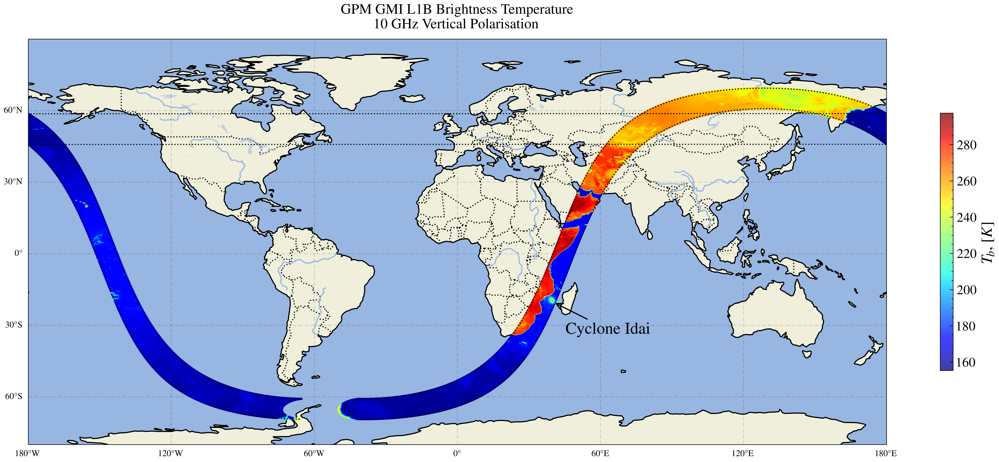

In [46]:

with plt.style.context(['science', 'ieee']):
        
    fig = plt.figure( figsize=(3,3) )
    fig.set_size_inches(14, 11)
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    #set_extent(extents, crs=None)[source]
    #Set the extent (x0, x1, y0, y1) of the map in the given coordinate system.
    #If no crs is given, the extents’ coordinate system will be assumed to be the Geodetic
    #version of this axes’ projection.
    ax.set_extent([-180, 180, -80, 90], crs=ccrs.PlateCarree())
    ## add features -----------------------------------------------------------------------
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.RIVERS)
    
    #plot swaths (GMI) 
    ax.plot(LON[:,0]-0.1,LAT[:,0],':k',zorder=4)
    ax.plot(LON[:,-1]+0.1,LAT[:,-1],':k',zorder=4)
    ## plot data -----------------------------------------------------------------------
    #ax.pcolormesh(LON, LAT, Tb_S1_10GHZ_V, cmap=plt.get_cmap('jet'), transform=ccrs.PlateCarree(), 
    #              vmin=min_S1_Tb, vmax=max_S1_Tb)
    gmi_band = ax.scatter(LON, LAT, c=Tb_10GHZ_V, s=0.75, cmap=plt.get_cmap('jet'),
                          edgecolor=None, zorder=3, alpha=0.75, 
                          vmin=min_10GHZ_V,vmax=max_10GHZ_V)
    ## add colorbar -----------------------------------------------------------------------
    cbar = plt.colorbar(gmi_band,shrink=0.3)
    cbar.set_label('$T_b$, [$K$]',fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    ## add title -----------------------------------------------------------------------
    ax.set_title('GPM GMI L1B Brightness Temperature \n 10 GHz Vertical Polarisation',
                 y=1.01,
                 fontsize=13)
    ## add gridlines  -----------------------------------------------------------------------
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color="k", alpha=0.1, 
                      linestyle="--")
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    #gl.ylines = True
    #gl.xlines = True
    ## annotate ------------------------------------------------------------------------------------
    ax.annotate('Cyclone Idai', xy=(40.1, -20.25), xytext=(+50, -25), fontsize=15,
                textcoords='offset points', ha='center', va='center',
                arrowprops=dict(arrowstyle='->'), 
                transform=ccrs.Geodetic())
    # ------------------------------------------------------------------------------------------------
    plt.tight_layout()
    plt.show()

## Visualize 89GHz-V

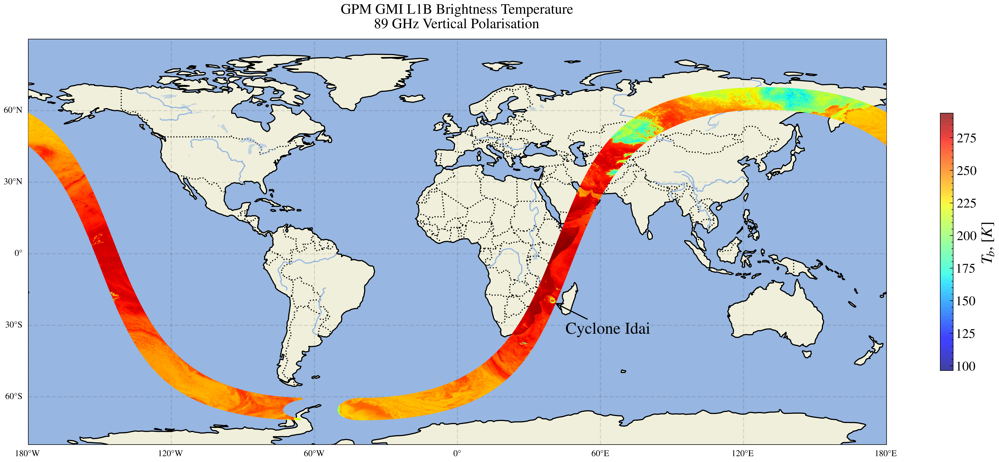

In [47]:

with plt.style.context(['science', 'ieee']):
        
    fig = plt.figure( figsize=(3,3) )
    fig.set_size_inches(14, 11)
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    #set_extent(extents, crs=None)[source]
    #Set the extent (x0, x1, y0, y1) of the map in the given coordinate system.
    #If no crs is given, the extents’ coordinate system will be assumed to be the Geodetic
    #version of this axes’ projection.
    ax.set_extent([-180, 180, -80, 90], crs=ccrs.PlateCarree())
    ## add features -----------------------------------------------------------------------
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.RIVERS)
    #plot swath 
    #ax.plot(LON[:,0]-0.1,LAT[:,0],':k',zorder=4)
    #ax.plot(LON[:,-1]+0.1,LAT[:,-1],':k',zorder=4)
    
    ## Plot GMI band -----------------------------------------------------------------------
    #gmi_band =  ax.pcolormesh(LON, LAT, Tb_S1_10GHZ_V, cmap=plt.get_cmap('jet'), 
    #                          transform=ccrs.PlateCarree(), vmin=min_89GHZ_V, vmax=max_89GHZ_V)
    gmi_band = ax.scatter(LON, LAT, c=Tb_89GHZ_V, s=0.75, cmap=plt.get_cmap('jet'),
                          edgecolor=None,zorder=3,alpha=0.75,
                          vmin=min_89GHZ_V,vmax=max_89GHZ_V)
    ## add GMI colorbar -----------------------------------------------------------------------
    cbar = plt.colorbar(gmi_band,shrink=0.3)
    cbar.set_label('$T_b$, [$K$]',fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    ## add title -----------------------------------------------------------------------
    ax.set_title('GPM GMI L1B Brightness Temperature \n 89 GHz Vertical Polarisation',
                 y=1.01,
                 fontsize=13)
    ## add gridlines ------------------------------------------------
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color="k", alpha=0.1, 
                      linestyle="--")
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    #gl.ylines = True
    #gl.xlines = True
    ## annotate -----------------------------------------------------------------------
    ax.annotate('Cyclone Idai', xy=(40.1, -20.25), xytext=(+50, -25), fontsize=15,
                textcoords='offset points', ha='center', va='center',
                arrowprops=dict(arrowstyle='->'), 
                transform=ccrs.Geodetic())
    # ------------------------------------------------------------------------------------------------
    plt.tight_layout()
    plt.show()

## Visualize 89 GHz-H

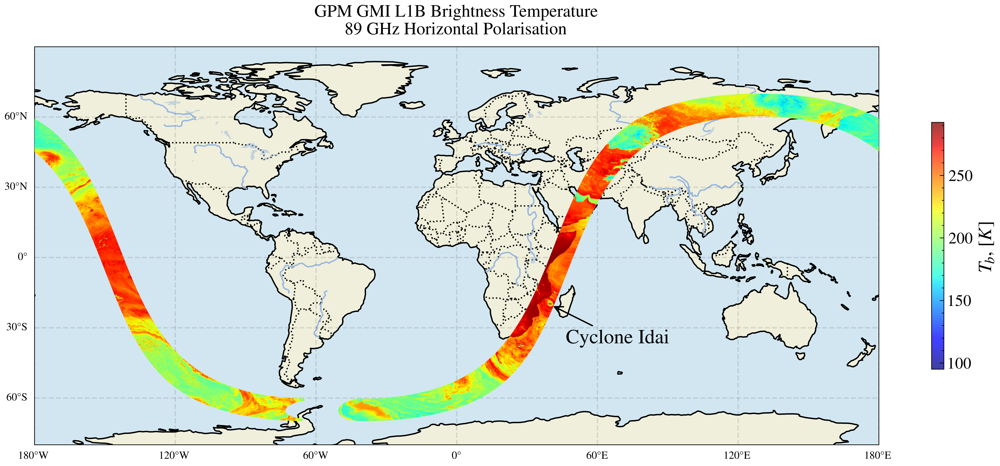

In [48]:

ocean_color = np.float64([209,230,241])/255


with plt.style.context(['science', 'ieee']):
        
    fig = plt.figure( figsize=(3,3), facecolor='white' )
    fig.set_size_inches(14, 11)
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    #set_extent(extents, crs=None)[source]
    #Set the extent (x0, x1, y0, y1) of the map in the given coordinate system.
    #If no crs is given, the extents’ coordinate system will be assumed to be the Geodetic
    #version of this axes’ projection.
    ax.set_extent([-180, 180, -80, 90], crs=ccrs.PlateCarree())
    ## add features-----------------------------------------------------------------------
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN,color=ocean_color,zorder=0,edgecolor='k')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.RIVERS)
    
    #plot swath 
    #ax.plot(LON[:,0]-0.1,LAT[:,0],':k',zorder=4)
    #ax.plot(LON[:,-1]+0.1,LAT[:,-1],':k',zorder=4)
    
    ## Plot GMI band -----------------------------------------------------------------------
    gmi_band = ax.scatter(LON, LAT, c=Tb_89GHZ_H, s=0.75, cmap=plt.get_cmap('jet'),
                          edgecolor=None,zorder=3,alpha=0.75,
                          vmin=min_89GHZ_H, vmax=max_89GHZ_H )
    ## add colorbar ---------------------------------------------------------------------
    cbar = plt.colorbar(gmi_band,shrink=0.3)
    cbar.set_label('$T_b$, [$K$]',fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    ## add title -----------------------------------------------------------------------------
    ax.set_title('GPM GMI L1B Brightness Temperature \n 89 GHz Horizontal Polarisation',
                 y=1.01,
                 fontsize=13)
    ## add gridlines ----------------------------------------------------
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color="k", alpha=0.1, 
                      linestyle="--")
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    #gl.ylines = True
    #gl.xlines = True
       
    ## annotate --------------------------------------------------------------------
    ax.annotate('Cyclone Idai', xy=(40.1, -20.25), xytext=(+50, -25), fontsize=15,
                textcoords='offset points', ha='center', va='center',
                arrowprops=dict(arrowstyle='->'), 
                transform=ccrs.Geodetic())
    
    ####
    #plt.tight_layout()
    plt.show()
